In [0]:
%%capture
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip
!unzip kagglecatsanddogs_3367a.zip
!mv PetImages train
!find train/Cat -size  0 -print0 |xargs -0 rm --
!find train/Dog -size  0 -print0 |xargs -0 rm --

Split some data for testing and validation. A very nice code to split images into train and test directory.

In [0]:
from glob import glob
from sklearn.model_selection import train_test_split

cats = glob('train/Cat/*.jpg')
dogs = glob('train/Dog/*.jpg')

cats_train, cats_test = train_test_split(cats, test_size=0.30)
dogs_train, dogs_test = train_test_split(dogs, test_size=0.30)

TRAIN_DIR = 'train'
TEST_DIR = 'test'

!mkdir test

!mkdir test/Cat
files = ' '.join(cats_test)
!mv -t test/Cat $files

!mkdir test/Dog
files = ' '.join(dogs_test)
!mv -t test/Dog $files

Model customization!
We are going to instantiate the InceptionV3 network from the keras.applications module, but using the flag include_top=False to load the model and their weights but leaving out the last fully connected layer, since that is specific to the ImageNet competition.

In [3]:
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.applications.inception_v3 import InceptionV3, preprocess_input

CLASSES = 2
    
# setup model
base_model = InceptionV3(weights='imagenet', include_top=False)

"""Then we add our custom classification layer, preserving the original Inception-v3 architecture 
but adapting the output to our number of classes. 
We use a GlobalAveragePooling2D preceding the fully-connected Dense layer of 2 outputs"""


x = base_model.output
x = GlobalAveragePooling2D(name='avg_pool')(x)
x = Dropout(0.4)(x)
predictions = Dense(CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

Using TensorFlow backend.


87916544/87910968 [==============================] - 2s 0us/step


In [0]:
# transfer learning
for layer in base_model.layers:
    layer.trainable = False
      
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

Data Augmentation for creating artificial training images using different parameters which genrates more variety of images to train the model.

In [0]:
from keras.preprocessing.image import ImageDataGenerator

WIDTH = 299
HEIGHT = 299
BATCH_SIZE = 32

# data prep
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [0]:
validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [7]:
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(HEIGHT, WIDTH),
		batch_size=BATCH_SIZE,
		class_mode='categorical')
    
validation_generator = validation_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(HEIGHT, WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical')

Found 17498 images belonging to 2 classes.
Found 7500 images belonging to 2 classes.


# Transfer Learning
Rather than needing to train  a neural network from scratch we can need a lot of data and take a long time to train, 
you can instead download maybe an open-source model that someone else has already trained on a huge dataset maybe for weeks and use those parameters as a starting point to 
then train your model just a little bit more on perhaps a smaller dataset that you have for a given task, so it is called transfer learning


Finally, we can train our custom classifier using the fit_generator method for transfer learning. In this example, it is going to take just a few minutes and five epochs to converge with a good accuracy.

In [8]:
EPOCHS = 5
BATCH_SIZE = 32
STEPS_PER_EPOCH = 240
VALIDATION_STEPS = 64

MODEL_FILE = 'filename.model'

history = model.fit_generator(
    train_generator,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_data=validation_generator,
    validation_steps=VALIDATION_STEPS)
  
model.save(MODEL_FILE)

Epoch 1/5
240/240 [==============================] - 211s 880ms/step - loss: 0.2516 - accuracy: 0.8936 - val_loss: 0.0949 - val_accuracy: 0.9360
Epoch 2/5
240/240 [==============================] - 202s 840ms/step - loss: 0.1544 - accuracy: 0.9378 - val_loss: 0.2446 - val_accuracy: 0.9385
Epoch 3/5
239/240 [============================>.] - ETA: 0s - loss: 0.1591 - accuracy: 0.9363

/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 32 bytes but only got 0. Skipping tag 270
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 5 bytes but only got 0. Skipping tag 271
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 272
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 282
  " Skipping tag %s" % (size, len(data), tag)
/usr/local/lib/python3.6/dist-packages/PIL/TiffImagePlugin.py:770: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only

240/240 [==============================] - 204s 850ms/step - loss: 0.1588 - accuracy: 0.9365 - val_loss: 0.1053 - val_accuracy: 0.9170
Epoch 4/5
240/240 [==============================] - 205s 852ms/step - loss: 0.1366 - accuracy: 0.9467 - val_loss: 0.0083 - val_accuracy: 0.9630
Epoch 5/5
240/240 [==============================] - 208s 867ms/step - loss: 0.1311 - accuracy: 0.9474 - val_loss: 0.4913 - val_accuracy: 0.9116


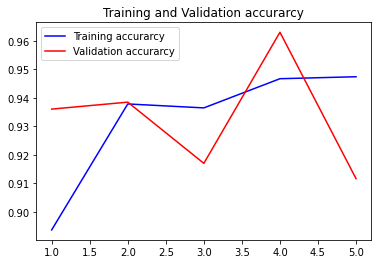

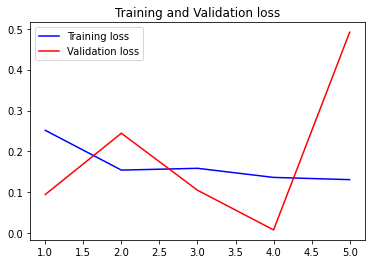

In [10]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()

plt.figure()
#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()

plt.show()

In [11]:
train_generator.class_indices

{'Cat': 0, 'Dog': 1}

#### Let's test the model on real world data.

In [12]:
#Custome lib for Google Colab to upload files
from google.colab import files
uploaded = files.upload()

Saving Cat_test.jpg to Cat_test.jpg
Saving Dog_test.jpg to Dog_test.jpg


In [0]:
from keras.models import load_model
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

model = load_model('filename.model')
model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

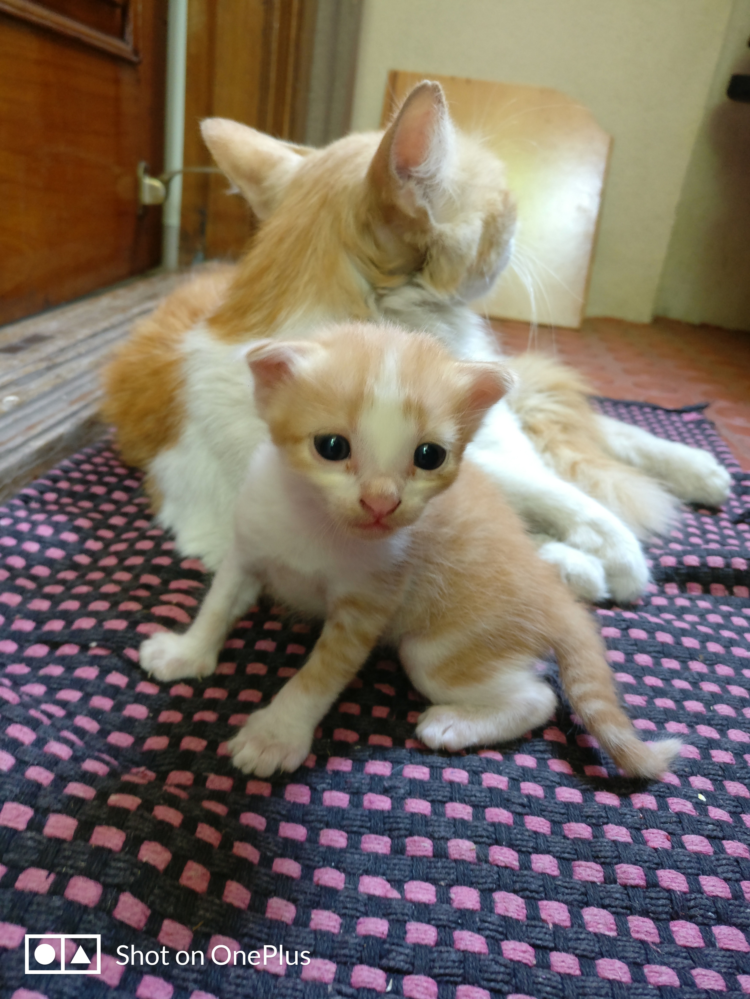

Probabilities for both classes :  [[0.8920164  0.10798357]]


In [14]:
#True positive image of a Cat!
img = cv2.imread('Cat_test.jpg')
cv2_imshow(img)
img = cv2.resize(img,(299,299))
img = np.reshape(img,[1,299,299,3])

#Keras predict_classes can be used only when we design a sequential NN model,
#as we are using transfer learning, we need predict() method here.
classes = model.predict(img)

#Classes will simply return probabilty of img in two classes, we can use armax
#here to get the max one.
print("Probabilities for both classes : ", classes)